# Example of usage

In [45]:
#Autoreload .py files
%load_ext autoreload
%autoreload 2

#https://github.com/chmp/ipytest/issues/80
import sys
sys.breakpointhook = sys.__breakpointhook__

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Load required libraries

In [46]:
import xarray as xr
import numpy as np
from pathlib import Path
from xarrayvideo import xarray2video, video2xarray, gap_fill, plot_image, to_netcdf
import matplotlib.pyplot as plt

Set up some variables and load an example minicube

In [47]:
array_id= '-111.49_38.60'
input_path= 'mc_-111.49_38.60_1.2.2_20230702_0.zarr'
output_path= './out'

In [48]:
minicube= xr.open_dataset(input_path, engine='zarr')
minicube['SCL']= minicube['SCL'].astype(np.uint8) #Fixes problem with the dataset
minicube['cloudmask_en']= minicube['cloudmask_en'].astype(np.uint8)
#minicube= minicube.drop_vars('B07') #We drop a variable for now

In [49]:
minicube

<xarray.Dataset>
Dimensions:       (time: 495, y: 128, x: 128, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 2016-01-03T12:00:00 ... 2022-10-08T12...
  * x             (x) float64 9.787e+05 9.787e+05 ... 9.812e+05 9.812e+05
  * x_300         (x_300) float64 9.785e+05 9.788e+05 ... 9.806e+05 9.809e+05
  * y             (y) float64 4.288e+06 4.288e+06 ... 4.285e+06 4.285e+06
  * y_300         (y_300) float64 4.288e+06 4.287e+06 ... 4.286e+06 4.285e+06
Data variables: (12/38)
    B02           (time, y, x) float32 ...
    B03           (time, y, x) float32 ...
    B04           (time, y, x) float32 ...
    B05           (time, y, x) float32 ...
    B06           (time, y, x) float32 ...
    B07           (time, y, x) float32 ...
    ...            ...
    t2m_max       (time) float32 ...
    t2m_mean      (time) float32 ...
    t2m_min       (time) float32 ...
    tp_max        (time) float32 ...
    tp_mean       (time) float32 ...
    tp_min        (time) float32 ...
Attributes: (12/27)
    Conventions:               CF-1.7
    base_minicube:             deepextremes-minicubes/1.1.p/mc_-111.49_38.60_...
    base_version:              1.1.p
    changes:                   https://github.com/bcdev/deepextremes/minicube...
    creation_date:             2023-06-18 01:58:08
    data_id:                   mc_-111.49_38.60_1.2.2_20230702_0
    ...                        ...
    time_coverage_resolution:  P5DT0H0M0S
    time_coverage_start:       2016-01-01T00:00:00+00:00
    time_period:               5D
    time_range:                ['2016-01-01', '2022-10-10']
    title:                     Minicube at -111.49 38.60
    version:                   1.2.2

Fix the small jitter betweeen timesteps to improve compression

In [50]:
import satalign

#Reload minicube for testing
minicube= xr.open_dataset(input_path, engine='zarr')
minicube['SCL']= minicube['SCL'].astype(np.uint8) #Fixes problem with the dataset
minicube= minicube.drop_vars('B07') #We drop a variable for now

bands= ['B04','B03','B02','B8A','B06','B05']
reference_image= minicube[bands].isel(time=slice(74,None)).mean("time").to_array().transpose('variable', 'y', 'x')
datacube= minicube[bands].to_array().transpose('time', 'variable', 'y', 'x')

syncmodel= satalign.PCC( #PCC quicker, ECC more precise
    datacube=datacube, # T x C x H x W
    reference=reference_image, # C x H x W
    channel="mean", crop_center=96, num_threads=1)
new_cube, warps= syncmodel.run_multicore()

/home/oscar/.conda/envs/pt2/lib/python3.10/site-packages/satalign/pcc.py:78: UserWarning: Could not determine RMS error between images with the normalized average intensities 9214516.0 and 0.0. Either the reference or moving image may be empty.
  shift, error, diffphase = phase_cross_correlation(
/home/oscar/.conda/envs/pt2/lib/python3.10/site-packages/satalign/main.py:227: UserWarning: Estimated translation is too large
  warnings.warn("Estimated translation is too large")


In [51]:
#Plot scatter plot
warp_df = satalign.utils.warp2df(warps, datacube.time.values)
satalign.utils.plot_s2_scatter(warp_df)

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [52]:
#Copy back
for b in bands:
    minicube[b]= new_cube.sel(variable=b)

Gap-fill in clouds

For now, we won't apply gap-filling of the clouds, since it is too big of a change to the data. If a good gap-filling algorithm were to be used, we could save up much more space when converting to video

In [53]:
#Perform the gap filling. Three methods: last_value, interp_forward, interp (non-causal!!)
minicube_filled= gap_fill(minicube, fill_bands=bands, mask_band='cloudmask_en',
                          fill_values=[1, 3, 4], method='last_value', new_mask='invalid', 
                          coord_names=('time', 'variable', 'x', 'y'))

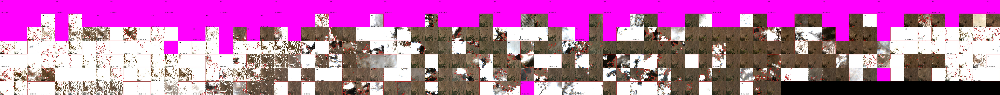

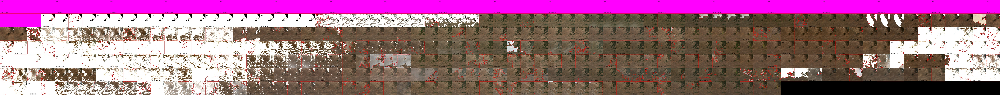

In [54]:
#RGB orig
plot_image(minicube, ['B04','B03','B02'], mask_name='cloudmask_en', save_name='./out/RGB original.jpg')

#RGB gap-filled
plot_image(minicube_filled, ['B04','B03','B02'], mask_name='invalid', save_name='./out/RGB gap-filled.jpg')

In [55]:
minicube

<xarray.Dataset>
Dimensions:       (time: 495, y: 128, x: 128, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 2016-01-03T12:00:00 ... 2022-10-08T12...
  * x             (x) float64 9.787e+05 9.787e+05 ... 9.812e+05 9.812e+05
  * x_300         (x_300) float64 9.785e+05 9.788e+05 ... 9.806e+05 9.809e+05
  * y             (y) float64 4.288e+06 4.288e+06 ... 4.285e+06 4.285e+06
  * y_300         (y_300) float64 4.288e+06 4.287e+06 ... 4.286e+06 4.285e+06
    variable      <U3 'B04'
Data variables: (12/37)
    B02           (time, y, x) float32 0.0 0.0 0.0 ... 0.06185 0.06106 0.06242
    B03           (time, y, x) float32 0.0 0.0 0.0 ... 0.08014 0.07839 0.0823
    B04           (time, y, x) float32 0.0 0.0 0.0 ... 0.09636 0.09845 0.1036
    B05           (time, y, x) float32 0.0 0.0 0.0 0.0 ... 0.1155 0.1171 0.1222
    B06           (time, y, x) float32 0.0 0.0 0.0 0.0 ... 0.1332 0.1409 0.1453
    B8A           (time, y, x) float32 0.0 0.0 0.0 0.0 ... 0.156 0.1662 0.1658
    ...            ...
    t2m_max       (time) float32 ...
    t2m_mean      (time) float32 ...
    t2m_min       (time) float32 ...
    tp_max        (time) float32 ...
    tp_mean       (time) float32 ...
    tp_min        (time) float32 ...
Attributes: (12/27)
    Conventions:               CF-1.7
    base_minicube:             deepextremes-minicubes/1.1.p/mc_-111.49_38.60_...
    base_version:              1.1.p
    changes:                   https://github.com/bcdev/deepextremes/minicube...
    creation_date:             2023-06-18 01:58:08
    data_id:                   mc_-111.49_38.60_1.2.2_20230702_0
    ...                        ...
    time_coverage_resolution:  P5DT0H0M0S
    time_coverage_start:       2016-01-01T00:00:00+00:00
    time_period:               5D
    time_range:                ['2016-01-01', '2022-10-10']
    title:                     Minicube at -111.49 38.60
    version:                   1.2.2

Since we are basically using `ffmpeg` for the enconding, here are some important commands

In [182]:
#Get info of a particular encoder
!ffmpeg -h encoder=vp9 -v quiet #vp9, libx264

Encoder libvpx-vp9 [libvpx VP9]:
    General capabilities: dr1 delay threads 
    Threading capabilities: other
    Supported pixel formats: yuv420p yuva420p yuv422p yuv440p yuv444p yuv420p10le yuv422p10le yuv440p10le yuv444p10le yuv420p12le yuv422p12le yuv440p12le yuv444p12le gbrp gbrp10le gbrp12le
libvpx-vp9 encoder AVOptions:
  -lag-in-frames     <int>        E..V....... Number of frames to look ahead for alternate reference frame selection (from -1 to INT_MAX) (default -1)
  -arnr-maxframes    <int>        E..V....... altref noise reduction max frame count (from -1 to INT_MAX) (default -1)
  -arnr-strength     <int>        E..V....... altref noise reduction filter strength (from -1 to INT_MAX) (default -1)
  -arnr-type         <int>        E..V....... altref noise reduction filter type (from -1 to INT_MAX) (default -1)
     backward        1            E..V.......
     forward         2            E..V.......
     centered        3            E..V.......
  -tune              <int> 

Compress and write new file

If you get `ContainsGroupError`, make sure to delete the existing `out` folder:

In [192]:
#Remove out folder to avoid errors
!rm -rf ./out

rm: no se puede borrar './out/-111.49_38.60/.nfs00000017002add460000001e': Dispositivo o recurso ocupado
rm: no se puede borrar './out/-111.49_38.60/.nfs00000017002add4700000020': Dispositivo o recurso ocupado
rm: no se puede borrar './out/-111.49_38.60/.nfs00000017002add4f00000021': Dispositivo o recurso ocupado
rm: no se puede borrar './out/-111.49_38.60/.nfs00000017002add5000000022': Dispositivo o recurso ocupado


Define conversion rules for the different bands. The syntax is:
```
'video_name': ( 
    var or (var1, var2, var3), #Variables present in the xarray
    (t_coord_name, x_coord_name, y_coord_name), #Names of the coordinates in order (t, x, y)
    'lossy' or 'lossless' #compression (e.g. lossless for uint8 masks)
    ),
...
```

In [193]:
#Define conversion rules for the different bands
conversion_rules= {
    # 'r': ( 'B04', ('time','x','y'), 'lossy'), #1 channel + lossy not working
    # 'ir4': ( ('B07','B06','B05','B8A'), ('time','x','y'), 'lossy'), #4 channels not working
    'rgb': ( ('B04','B03','B02'), ('time','x','y'), 'lossy'),
    'ir3': ( ('B8A','B06','B05'), ('time','x','y'), 'lossy'),
    'cm': ( 'cloudmask_en', ('time','x','y'), 'lossless'),
    'scl': ( 'SCL', ('time','x','y'), 'lossless'),
    }

In [194]:
#Save original minicube for comparing the size (it will be compressed)
Path(output_path).mkdir(exist_ok=True, parents=True)
#minicube.to_zarr(Path(output_path) / f'{array_id}.zarr')
to_netcdf(minicube, Path(output_path) / f'{array_id}.nc')

rgb: 23.20Mb -> 0.95Mb (4.11% of original size) in 1.06s
 - params={'c:v': 'libx264', 'preset': 'slow', 'crf': 11, 'pix_fmt': 'rgb24', 'r': 30}


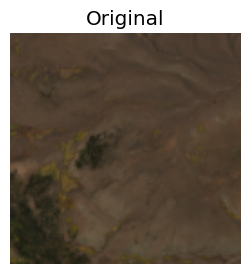

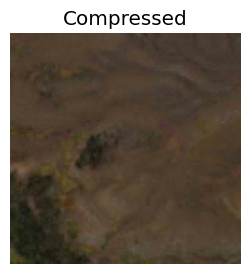

 - MSE_sat 0.000055 (input saturated to [(0.0, 1.0)])
 - SNR_sat 35.0185 (input saturated to [(0.0, 1.0)])
 - PSNR_sat 42.6247 (input saturated to [(0.0, 1.0)])
 - Exp. SA 0.0257 (input saturated to [(0.0, 1.0)])
 - Err. SA 0.0001 (input saturated to [(0.0, 1.0)])
ir3: 23.20Mb -> 0.93Mb (4.01% of original size) in 1.18s
 - params={'c:v': 'libx264', 'preset': 'slow', 'crf': 11, 'pix_fmt': 'rgb24', 'r': 30}


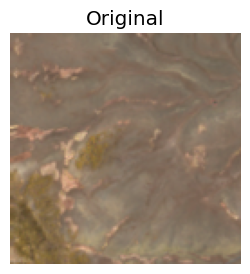

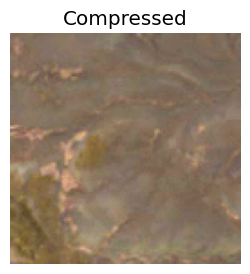

 - MSE_sat 0.000064 (input saturated to [(0.0, 1.0)])
 - SNR_sat 34.4863 (input saturated to [(0.0, 1.0)])
 - PSNR_sat 41.9240 (input saturated to [(0.0, 1.0)])
 - Exp. SA 0.0188 (input saturated to [(0.0, 1.0)])
 - Err. SA 0.0001 (input saturated to [(0.0, 1.0)])
cm: 7.73Mb -> 0.08Mb (0.98% of original size) in 0.07s
 - params={'vcodec': 'ffv1', 'pix_fmt': 'gray', 'r': 30}


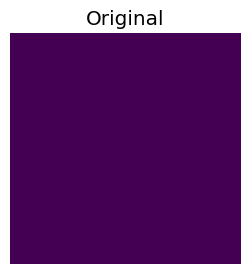

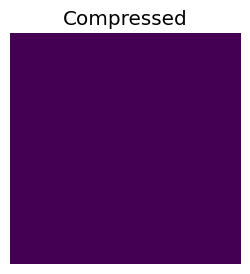

 - acc 1.00
scl: 7.73Mb -> 0.29Mb (3.70% of original size) in 0.10s
 - params={'vcodec': 'ffv1', 'pix_fmt': 'gray', 'r': 30}


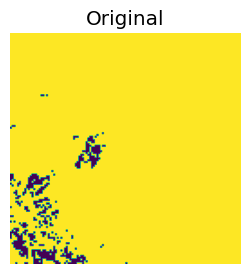

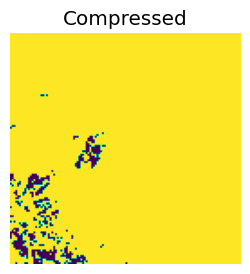

 - acc 1.00


PermissionError: [Errno 13] Permission denied: '/home/oscar/xarrayvideo/out/-111.49_38.60/x.nc'

In [233]:
from xarrayvideo import xarray2video, video2xarray

#Define the output video encoding parameters
#Lossless
lossless_params= {'vcodec':'ffv1'}

#Lossy with x264
# input_pix_fmt= {1:'gray', 3:'rgb24', 4:'yuva420p'}[channels]
# output_pix_fmt= {1:'gray', 3:'rgb24', 4:'yuva420p'}[channels] 
lossy_params = {
    'c:v': 'libx264',  #libx264 always seems better for rgb[libx264, libx265, vp9, ffv1]
    'preset': 'slow',  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
    'crf': 11, #14 default, 11 for higher quality and size
    }

#Lossy with vp9
# input_pix_fmt= {1:'gray', 3:'gbrp', 4:'yuva420p'}[channels]
# output_pix_fmt= {1:'gray', 3:'gbrp', 4:'yuva420p'}[channels] 
# lossy_params = {
#     'c:v': 'vp9',  #libx264 always seems better for rgb[libx264, libx265, vp9, ffv1]
#     'preset': 'medium',  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
#     'crf': 11, #14 default, 11 for higher quality and size
#     }

#Run with compute_stats (takes a bit longer). Activating `use_ssim` takes even longer
arr_dict= xarray2video(minicube, array_id, conversion_rules, value_range=(0.,1.),
                       lossy_params=lossy_params, lossless_params=lossless_params, fmt='mkv',
                       output_path=output_path, use_ssim=False, compute_stats=True,
                       loglevel='quiet', #verbose, quiet
                       )  

In [196]:
#Get info of an encoded video
#!ffprobe -v error -show_format -show_streams out/-111.49_38.60/r.mkv

Compute total size, and observe a signficant compression rate (~20x)

In [198]:
original_path= str(Path(output_path) / f'{array_id}.nc')
!du -h {original_path} -d0

100M	out/-111.49_38.60.nc


In [199]:
new_path= str(Path(output_path) / f'{array_id}')
!du -h {new_path} 

8,2M	out/-111.49_38.60


Read again the written file, and check that everything has persisted

In [219]:
minicube_new= video2xarray(output_path, array_id, fmt='mkv') 
minicube_new

<xarray.Dataset>
Dimensions:       (y: 128, x: 128, time: 495, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 2016-01-03T12:00:00 ... 2022-10-08T12...
  * x             (x) float64 9.787e+05 9.787e+05 ... 9.812e+05 9.812e+05
  * x_300         (x_300) float64 9.785e+05 9.788e+05 ... 9.806e+05 9.809e+05
  * y             (y) float64 4.288e+06 4.288e+06 ... 4.285e+06 4.285e+06
  * y_300         (y_300) float64 4.288e+06 4.287e+06 ... 4.286e+06 4.285e+06
    variable      object ...
Data variables: (12/37)
    cop_dem       (y, x) float32 ...
    crs_300       int64 ...
    e_max         (time) float32 ...
    e_mean        (time) float32 ...
    e_min         (time) float32 ...
    event_labels  (event_time) uint16 ...
    ...            ...
    B02           (time, x, y) float32 0.0 0.0 0.0 ... 0.0549 0.05882 0.06667
    B8A           (time, x, y) float32 0.0 0.0 0.0 0.0 ... 0.1647 0.1608 0.149
    B06           (time, x, y) float32 0.0 0.0 0.0 0.0 ... 0.1373 0.1412 0.1412
    B05           (time, x, y) float32 0.0 0.0 0.0 0.0 ... 0.1176 0.1216 0.1294
    cloudmask_en  (time, x, y) uint8 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    SCL           (time, x, y) uint8 0 0 0 0 0 0 0 0 0 0 ... 5 5 5 5 5 5 5 5 5 5
Attributes: (12/27)
    Conventions:               CF-1.7
    base_minicube:             deepextremes-minicubes/1.1.p/mc_-111.49_38.60_...
    base_version:              1.1.p
    changes:                   https://github.com/bcdev/deepextremes/minicube...
    creation_date:             2023-06-18 01:58:08
    data_id:                   mc_-111.49_38.60_1.2.2_20230702_0
    ...                        ...
    time_coverage_resolution:  P5DT0H0M0S
    time_coverage_start:       2016-01-01T00:00:00+00:00
    time_period:               5D
    time_range:                ['2016-01-01', '2022-10-10']
    title:                     Minicube at -111.49 38.60
    version:                   1.2.2

Visualize results

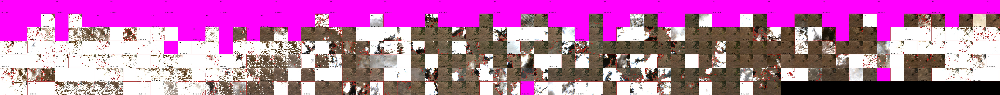

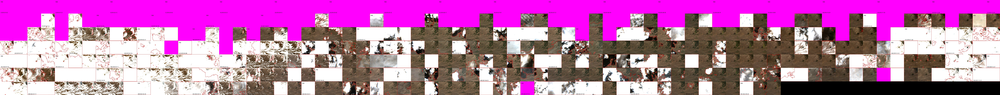

In [223]:
#RGB orig
plot_image(minicube, ['B04','B03','B02'], save_name='./out/RGB original.jpg')

#RGB compressed
plot_image(minicube_new, ['B04','B03','B02'], save_name='./out/RGB compressed.jpg')

In [224]:
#R3 original
#plot_image(minicube, ['B8A','B06','B05'], save_name='R3 original.jpg')

#R3 compressed
#plot_image(minicube_new, ['B8A','B06','B05'], save_name='R3 compressed.jpg')

In [ ]:
#Gray compressed
plot_image(minicube, ['B07'], plot_idx=[[0]], save_name='Gray Compressed.jpg')

#RGBA compressed
plot_image(minicube, ['B8A','B07','B06','B05'], plot_idx=[[0],[1],[2],[3]], save_name='RGBA Compressed.jpg')
# txy_real_rgba_compressed= np.transpose(arr_dict['ir4'][0], (3,0,1,2)) #t,x,y,3 -> 4,t,x,y

Watch as a video (some formats might not be supported)

In [176]:
from IPython.display import Video, display, HTML, Image
for video in conversion_rules.keys():
    display(HTML(f'<h4>{video}</h4>'))
    display(Video(Path(output_path) / array_id / f'{video}.mkv', width=512, height=512))

Plot some compression graphs

In [ ]:
#Remove out folder to avoid errors
!rm -rf ./testing

In [ ]:
assert False, 'Comment this cell to run. This takes a long time'

#Load libs
from tqdm.notebook import tqdm
import warnings
rng= np.random.default_rng(seed=42)

#Define crfs and tests
tests= ['libx264_slow_ffv1'] #'libx265_medium_ffv1', 'vp9_medium_vp9', 
crfs= [-1, 0,1,2,4,7,11,16,22,29]
use_ssim=False

#Take N random cubes
dataset_in_path= Path('/scratch/users/deepextremes/deepextremes-minicubes/full')
cube_paths= np.array(list(dataset_in_path.glob('*/*.zarr')))
rng.shuffle(cube_paths)
cube_paths= cube_paths[:20]

#Run
overall_results={}
for input_path in (pbar:=tqdm(cube_paths, total=len(cube_paths))):
    #Create cube id
    array_id= '_'.join(input_path.stem.split('_')[1:3])
    overall_results[array_id]= {}

    #Load
    minicube= xr.open_dataset(input_path, engine='zarr')
    minicube['SCL']= minicube['SCL'].astype(np.uint8) #Fixes problem with the dataset
    minicube['cloudmask_en']= minicube['cloudmask_en'].astype(np.uint8)
    minicube= minicube.drop_vars('B07') #We drop a variable for now

    #Align
    bands= ['B04','B03','B02','B8A','B06','B05']
    minicube[bands]= minicube[bands].isel(time=slice(74*2,None)) #Frist two years have too much missing data
    reference_image= minicube[bands].mean("time").to_array().transpose('variable', 'y', 'x')
    datacube= minicube[bands].to_array().transpose('time', 'variable', 'y', 'x')
    with warnings.catch_warnings(): 
        warnings.simplefilter("ignore")
        syncmodel= satalign.PCC( #PCC quicker, ECC more precise
            datacube=datacube, # T x C x H x W
            reference=reference_image, # C x H x W
            channel="mean", crop_center=96, num_threads=1)
        new_cube, warps= syncmodel.run_multicore()
        for b in bands: minicube[b]= new_cube.sel(variable=b)

    for test in tests:
        overall_results[array_id][test]= {}
        for crf in crfs:
            #Update pbar
            pbar.set_description(f'{test=} | {array_id=} | {crf=}')

            #Set up parameters
            codec_lossy, preset, codec_lossless= test.split('_')
            lossless_params= {
                'vcodec': codec_lossless,
                'preset': preset, 
                } 
            lossy_params = {
                'c:v': codec_lossy,  #libx264 always seems better for rgb[libx264, libx265, vp9, ffv1]
                'preset': preset,  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
                'crf': crf, #14 default, 11 for higher quality and size
                }
            if codec_lossless == 'vp9': #vp9 can do lossless compression (I think)
                lossless_params= lossy_params

            conversion_rules= {
                # 'r': ( 'B04', ('time','x','y'), 'lossy'), #1 channel + lossy not working
                # 'ir4': ( ('B8A','B07','B06','B05'), ('time','x','y'), 'lossy'), #4 channels not working
                'rgb': ( ('B04','B03','B02'), ('time','x','y'), 'lossy' if crf>=0 else 'lossless'),
                'ir3': ( ('B8A','B06','B05'), ('time','x','y'), 'lossy' if crf>=0 else 'lossless'),
                }

            #Run with compute_stats (takes a bit longer). Activating `use_ssim` takes even longer
            results= xarray2video(minicube, array_id, conversion_rules, value_range=(0.,1.),
                                   lossy_params=lossy_params, lossless_params=lossless_params, fmt='mkv',
                                   output_path=Path('./testing/'), use_ssim=use_ssim, compute_stats=True,
                                   loglevel='quiet',#verbose, quiet
                                   verbose=False,
                                   )
            overall_results[array_id][test][crf]= results

            #Delete files
            for file in [results['path']] + [results[v]['path'] for v in conversion_rules.keys()]:
                file.unlink()

Process the results into a pandas dataframe

In [ ]:
import pandas as pd
import seaborn as sns

#Reset matplotlib config and change defaults
import matplotlib.ticker as mtick
import matplotlib.pyplot as plt, matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)    
plt.style.use('ggplot')
mpl.rcParams.update({'font.size': 10})

#We will create a dict only with metric values and convert it to pandas with multiindex
results_metrics={}
metrics_keep= ['compression', 'snr', 'psnr', 'mse', 'bpppb', 'exp_sa', 'time'] + (['ssim'] if use_ssim else [])
for cube, cube_results in overall_results.items():
    #if cube not in ['_'.join(p.stem.split('_')[1:3]) for p in cube_paths]: continue
    for test, test_results in cube_results.items():
        for crf, crf_results in test_results.items():
            for video_name, metadata in crf_results.items():
                if isinstance(metadata, dict): #Ignore 'path'
                    for metric in metrics_keep:
                        results_metrics[(metric, video_name, test, cube, crf)]= metadata[metric]
results_df = pd.DataFrame.from_dict(results_metrics, orient='index', columns=['value'])
results_df.index = pd.MultiIndex.from_tuples(results_df.index)
results_df.index.names = ['metric', 'video_name', 'test_name', 'cube', 'crf']
results_df.to_pickle('results.pkl')

Plot them!

In [ ]:
#Now plot it! 
# results_df= pd.read_pickle('results_h264_h265.pkl')
x_label= 'bpppb' #One of {'Compression percentage', 'Compression factor', 'bpppb'}
metrics_plot= {'psnr':'PSNR (dB)', 'snr':'SNR (dB)', 'mse':'MSE',
                'ssim':'SSIM', 'exp_sa':'SA (radians)', 'time': 'Compression time (s)'}
metrics_plot= {m:label for m, label in metrics_plot.items() if m in metrics_keep}
f, axes= plt.subplots(len(metrics_plot),1, figsize=(10,12))
for i, ((metric, ylabel), ax) in enumerate(zip(metrics_plot.items(), axes.flatten())):
    ax.set_ylabel(ylabel)

    if x_label == 'Compression factor':
        #If using a factor for compression
        ax.set_xscale('log')
        ax.xaxis.set_major_formatter(mtick.ScalarFormatter())
        ax.xaxis.set_minor_formatter(mtick.ScalarFormatter())
        ax.tick_params(axis='x', which='minor', labelsize=6) 
    elif x_label == 'Compression percentage':
        #If using percentage for compression
        ax.xaxis.set_major_formatter(mtick.PercentFormatter())
        start, end = ax.get_xlim()
        ax.xaxis.set_ticks(np.arange(0, end, 5))
    elif x_label == 'bpppb':
        ax.set_xscale('log')
        ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2f'))
        ax.xaxis.set_minor_formatter(mtick.FormatStrFormatter('%.2f'))
        ax.tick_params(axis='x', which='minor', labelsize=6) 
    else:
        raise AssertionError(f'Unknown {x_label=}')

    for video in conversion_rules.keys():
        for test in tests:
            data= results_df.xs(test, level='test_name').xs(video, level='video_name')
            metric_values= data.xs(metric, level='metric').values.flatten()
            if x_label == 'Compression factor':
                compression_values= 1/data.xs('compression', level='metric').values.flatten()
            elif x_label == 'Compression percentage':
                compression_values= data.xs('compression', level='metric').values.flatten()
            elif x_label == 'bpppb':
                compression_values= data.xs('bpppb', level='metric').values.flatten()
            else:
                raise AssertionError(f'Unknown {x_label=}')
            sns.regplot(x=compression_values, y=metric_values, ax=ax, lowess=True, 
                        scatter_kws={'s':5, 'alpha':1.}, label=f'{test}: {video}')

    if metric not in ['time']: 
        
        ax.axhline(metric_values[0], color='darkred', linestyle='--', label='uint8 discretization limit')
    if i==0: ax.legend()
        
ax.set_xlabel(x_label)
plt.show()

## TO DO
 - ~~Read https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=6080751~~ 
 - Read more literature: 
   - https://ietresearch.onlinelibrary.wiley.com/doi/full/10.1049/ipr2.12077
 - ~~Implement Spectral Angle Metric~~
 - Images are being read in an improper order depending on code
 - Test different pixel formats
 - Try compressing 1 / 4 bands
 - Try KLT (Karhunen-Loève Transform, also known as PCA before compressing
 - Test compression without band alignment / with cloud filling
 - Write paper